# A Large Scale Fish Dataset

# Support Vector Machine

In [0]:
!pip install opencv-python

Requirement already satisfied: opencv-python in /databricks/conda/envs/databricks-ml/lib/python3.8/site-packages (4.5.2.54)
Requirement already satisfied: numpy>=1.17.3 in /databricks/conda/envs/databricks-ml/lib/python3.8/site-packages (from opencv-python) (1.19.2)

In [0]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pickle
import random
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

from __future__ import absolute_import, division, print_function, unicode_literals

from __future__ import absolute_import, division, print_function, unicode_literals

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, layers, models
import tensorflow.keras.optimizers as Optimizer

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
print(tf.__version__)

2.4.1

In [0]:
#%ls /dbfs/mnt/bronce1/Proyecto1/NA_Fish_Dataset
dbutils.fs.ls("/mnt/bronce1/Proyecto1/NA_Fish_Dataset")

Out[3]: [FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Black Sea Sprat/', name='Black Sea Sprat/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Gilt Head Bream/', name='Gilt Head Bream/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Horse Mackerel/', name='Horse Mackerel/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Red Mullet/', name='Red Mullet/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Red Sea Bream/', name='Red Sea Bream/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Sea Bass/', name='Sea Bass/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Shrimp/', name='Shrimp/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Striped Red Mullet/', name='Striped Red Mullet/', size=0),
 FileInfo(path='dbfs:/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Trout/', name='Trout/', size=0)]

In [0]:
ruta = '/dbfs/mnt/bronce1/Proyecto1/NA_Fish_Dataset'
categorias = ['Black Sea Sprat','Gilt Head Bream','Horse Mackerel','Red Mullet','Red Sea Bream','Sea Bass', 'Shrimp', 'Striped Red Mullet', 'Trout']

In [0]:
data = []
for categoria in categorias:
  path = os.path.join(ruta,categoria)
  label = categorias.index(categoria)
  for  img in os.listdir(path):
    imgpath = os.path.join(path,img)
    pet_img = cv2.imread(imgpath)
    #cv2_imshow(pet_img)
    try:
      pet_img = cv2.resize(pet_img,(100,100))
      #cv2_imshow(pet_img)
      img = np.array(pet_img).flatten()
      data.append([img, label])
    except Exception as e:
      print(e)
    #print(img.shape)

In [0]:
pick_in = open('/dbfs/mnt/bronce1/Proyecto1/out/data1.pickle','wb')
pickle.dump(data,pick_in)
pick_in.close()

In [0]:
pick_out = open('/dbfs/mnt/bronce1/Proyecto1/out/data1.pickle','rb')
#pick_out = open('/content/drive/MyDrive/data1.pickle','rb')
data = pickle.load(pick_out)
pick_out.close()

In [0]:
features = []
labels = []
random.shuffle(data)
for feature, label in data:
  features.append(feature)
  labels.append(label)

In [0]:
x_train, x_test, y_train, y_test = train_test_split(features, labels, train_size=0.75)

In [0]:
modelo = SVC(C=1, kernel='poly', gamma='auto')
modelo.fit(x_train,y_train)
prediccion = modelo.predict(x_test)
precision = modelo.score(x_test, y_test)

In [0]:
precision

Out[9]: 0.7777777777777778

Out[12]:

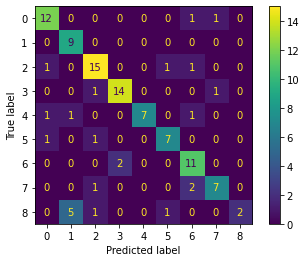

<sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay at 0x7fcbd46c6400>

In [0]:
plot_confusion_matrix(modelo, x_test, y_test)

In [0]:
len(x_train)

Out[16]: 322

In [0]:
pick_modelo = open('/dbfs/mnt/bronce1/Proyecto1/out/svm_modelo.sav','wb')
pickle.dump(modelo,pick_modelo)
pick_modelo.close()

---------------------------------------------------------------------------
FileNotFoundError Traceback (most recent call last)
 in ()
----> 1 pick_modelo = open('/content/drive/MyDrive/datasets/PIntegrador1/out/svm_modelo.sav','wb')
 2 pickle.dump(modelo,pick_modelo)
 3 pick_modelo.close()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/datasets/PIntegrador1/out/svm_modelo.sav'

# KNN

In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [0]:
modelo = KNeighborsClassifier(n_neighbors=9)

In [0]:
modelo.fit(x_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
 metric_params=None, n_jobs=None, n_neighbors=9, p=2,
 weights='uniform')

In [0]:
y_pred = modelo.predict(x_test)

In [0]:
precision = precision_score(y_test, y_pred, average='macro')

In [0]:
precision

0.5984262650929317

<sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay at 0x7f814804bc50>

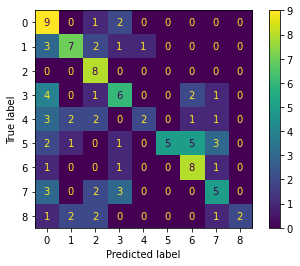

In [0]:
plot_confusion_matrix(modelo, x_test, y_test)  

# Redes neuronales

In [0]:
dataAux = []
for i in data:
  dataAux.append([np.reshape(i[0],(100,100)), i[1]])


In [0]:
featuresAux = []
labelsAux = []
random.shuffle(dataAux)
for feature, label in dataAux:
  featuresAux.append(feature)
  labelsAux.append(label)

x_train, x_test, y_train, y_test = train_test_split(featuresAux, labelsAux, train_size=0.75)

model = keras.models.Sequential([keras.layers.Flatten(input_shape = [100, 100]),
keras.layers.Dense(300, activation = 'relu' ),
keras.layers.Dense(100, activation = 'relu' ),
keras.layers.Dense(100, activation = 'relu' ),
keras.layers.Dense(100, activation = 'relu' ),
keras.layers.Dense(9, activation = 'softmax' )])

In [0]:
model.compile(loss = 'sparse_categorical_crossentropy',
optimizer = 'sgd',
metrics = ['accuracy'])

In [0]:
history = model.fit(np.array(x_train),
                    np.array(y_train),
                    epochs = 10,
                    validation_data=(np.array(x_test),np.array(y_test)))

Epoch 1/10
11/11 [==============================] - 0s 26ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 2/10
11/11 [==============================] - 0s 26ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 3/10
11/11 [==============================] - 0s 26ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 4/10
11/11 [==============================] - 0s 26ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 5/10
11/11 [==============================] - 0s 28ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 6/10
11/11 [==============================] - 0s 25ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 7/10
11/11 [==============================] - 0s 26ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 8/10
11/11 [==============================] - 0s 27ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 9/10
11/11 [==============================] - 0s 25ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037
Epoch 10/10
11/11 [==============================] - 0s 26ms/step - loss: nan - accuracy: 0.0870 - val_loss: nan - val_accuracy: 0.2037

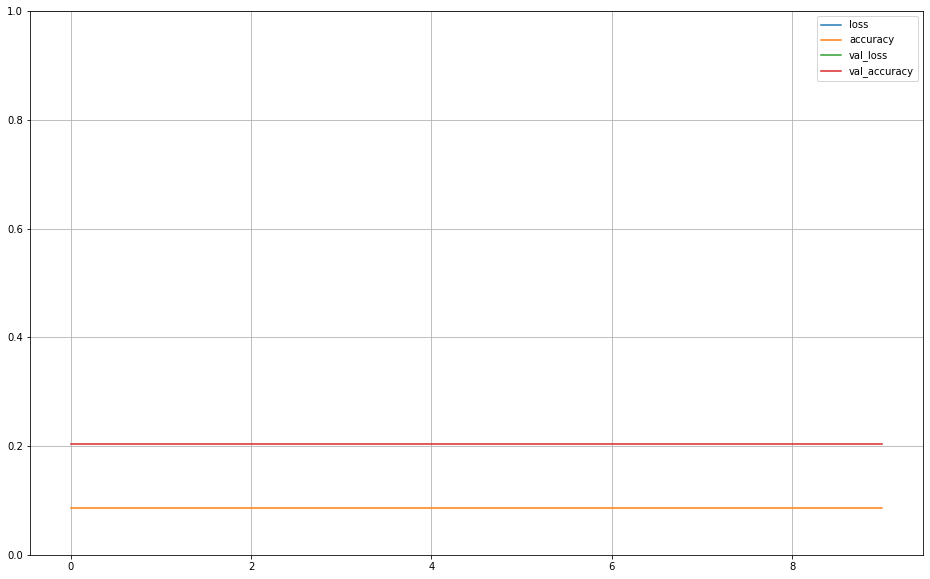

In [0]:
pd.DataFrame(history.history).plot(figsize = (16, 10))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [0]:
model.evaluate(np.array(x_test), np.array(y_test))

4/4 [==============================] - 0s 8ms/step - loss: nan - accuracy: 0.2037

[nan, 0.20370370149612427]

# No Supervisado - Kmeans

In [0]:
from sklearn.cluster import KMeans

In [0]:
kmeans = KMeans(n_clusters=9, random_state=0).fit(data[:50][0])

--------------------------------------------------------------------------- 
 TypeError Traceback (most recent call last)
 TypeError : only size-1 arrays can be converted to Python scalars

The above exception was the direct cause of the following exception:

 ValueError Traceback (most recent call last)
 <command-3393704034362655> in <module> 
 ----> 1 kmeans = KMeans ( n_clusters = 9 , random_state = 0 ) . fit ( data [ : 50 ] [ 0 ] ) 

 /databricks/python/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py in fit (self, X, y, sample_weight) 
 1028 Fitted estimator . 
 1029 """
 -> 1030 X = self._validate_data(X, accept_sparse='csr',
 1031 dtype = [ np . float64 , np . float32 ] , 
 1032 order = 'C' , copy = self . copy_x , 

 /databricks/python/lib/python3.8/site-packages/sklearn/base.py in _validate_data (self, X, y, reset, validate_separately, **check_params) 
 418 f"requires y to be passed, but the target y is None." 
 419 )
 --> 420 X = check_array ( X , ** check_params ) 
 421 out = X
 422 else : 

 /databricks/python/lib/python3.8/site-packages/sklearn/utils/validation.py in inner_f (*args, **kwargs) 
 70 FutureWarning)
 71 kwargs . update ( { k : arg for k , arg in zip ( sig . parameters , args ) } ) 
 ---> 72 return f ( ** kwargs ) 
 73 return inner_f
 74 

 /databricks/python/lib/python3.8/site-packages/sklearn/utils/validation.py in check_array (array, accept_sparse, accept_large_sparse, dtype, order, copy, force_all_finite, ensure_2d, allow_nd, ensure_min_samples, ensure_min_features, estimator) 
 596 array = array . astype ( dtype , casting = "unsafe" , copy = False ) 
 597 else : 
 --> 598 array = np . asarray ( array , order = order , dtype = dtype ) 
 599 except ComplexWarning : 
 600 raise ValueError("Complex data not supported\n"

 /databricks/python/lib/python3.8/site-packages/numpy/core/_asarray.py in asarray (a, dtype, order) 
 81 
 82 """
 ---> 83 return array ( a , dtype , copy = False , order = order ) 
 84 
 85 

 ValueError : setting an array element with a sequence.

In [0]:
 data[:50][0]

[array([92, 98, 97, ..., 36, 37, 33], dtype=uint8), 0]

In [0]:
kmeans.labels_

array([7, 6, 4, 2, 7, 5, 7, 8, 8, 1, 7, 2, 6, 7, 2, 6, 5, 1, 5, 5, 2, 2,
 4, 3, 3, 2, 1, 4, 5, 7, 6, 5, 6, 2, 6, 5, 0, 1, 3, 5, 4, 5, 4, 4,
 6, 4, 3, 4, 5, 1, 7, 1, 2, 4, 3, 4, 2, 6, 6, 2, 2, 0, 6, 3, 4, 5,
 6, 5, 7, 3, 1, 6, 2, 6, 5, 1, 4, 5, 5, 6, 8, 8, 7, 6, 1, 3, 3, 2,
 7, 2, 6, 3, 7, 0, 2, 2, 5, 1, 7, 7, 0, 5, 4, 8, 7, 3, 0, 2, 6, 8,
 2, 7, 6, 7, 3, 8, 1, 7, 7, 7, 5, 2, 3, 7, 0, 1, 1, 7, 5, 2, 3, 7,
 5, 3, 3, 4, 2, 7, 5, 7, 0, 6, 0, 4, 6, 5, 4, 1, 4, 5, 7, 6, 3, 5,
 5, 4, 1, 5, 5, 3, 5, 5, 8, 3, 3, 4, 6, 6, 4, 5, 0, 5, 7, 6, 6, 3,
 3, 3, 3, 5, 8, 4, 4, 2, 6, 8, 5, 5, 5, 7, 0, 3, 5, 8, 5, 4, 4, 1,
 8, 8, 8, 1, 2, 7, 1, 7, 7, 6, 3, 5, 3, 6, 3, 5, 0, 4, 8, 4, 4, 1,
 5, 4, 2, 3, 4, 4, 7, 8, 7, 6, 1, 5, 1, 4, 2, 8, 0, 5, 7, 8, 6, 3,
 1, 3, 5, 3, 3, 3, 4, 8, 4, 7, 4, 4, 7, 0, 5, 8, 0, 2, 7, 3, 7, 8,
 2, 3, 7, 2, 8, 7, 6, 7, 0, 5, 6, 4, 6, 1, 3, 7, 2, 7, 1, 4, 1, 4,
 6, 5, 8, 5, 5, 4, 3, 7, 2, 7, 3, 7, 6, 3, 6, 0, 5, 6, 0, 4, 3, 7,
 4, 2, 7, 6, 5, 7, 1, 4, 8, 1, 7, 7, 4, 7], dtype=int32)

# Random forest

In [0]:
from sklearn.ensemble import  RandomForestClassifier
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score

In [0]:
modelo = RandomForestClassifier(n_estimators=50,criterion='entropy')

In [0]:
modelo.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
 criterion='entropy', max_depth=None, max_features='auto',
 max_leaf_nodes=None, max_samples=None,
 min_impurity_decrease=0.0, min_impurity_split=None,
 min_samples_leaf=1, min_samples_split=2,
 min_weight_fraction_leaf=0.0, n_estimators=50,
 n_jobs=None, oob_score=False, random_state=None,
 verbose=0, warm_start=False)

In [0]:
y_pred = modelo.predict(x_test)

<sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay at 0x7f3426fb7150>

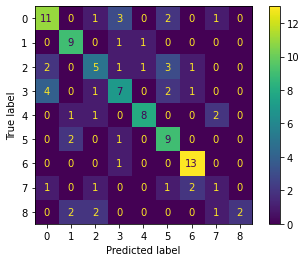

In [0]:
plot_confusion_matrix(modelo, x_test, y_test)

In [0]:
precision = precision_score(y_test, y_pred, average='macro')

In [0]:
precision

0.6114034839525035

## Ojo:
- Probar con más algoritmos, como lo de la "cara promedio"
- Terminar ejemplo de kmeans
- Terminar ejemplo convolucional de redes
- Más carreta e ir leyendo de los algoritmos

## Eigen Vectors

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io
plt.rcParams['figure.figsize']=[10,10]
plt.rcParams.update({'font.size':18})

In [0]:
X = []
path = '/dbfs/mnt/bronce1/Proyecto1/NA_Fish_Dataset/Trout'
for  img in os.listdir(path):
    imgpath = os.path.join(path,img)
    pet_img = cv2.imread(imgpath)
    pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
    #cv2_imshow(pet_img)
    try:
      pet_img = cv2.resize(pet_img,(100,100))
      #cv2_imshow(pet_img)
      img = np.array(pet_img).flatten().T
      X.append(img)
    except Exception as e:
      print(e)


In [0]:
X

[array([115, 126, 121, ..., 222, 218, 221], dtype=uint8),
 array([78, 85, 91, ..., 57, 56, 44], dtype=uint8),
 array([151, 49, 33, ..., 57, 58, 55], dtype=uint8),
 array([31, 28, 17, ..., 90, 90, 90], dtype=uint8),
 array([76, 70, 80, ..., 72, 73, 68], dtype=uint8),
 array([101, 112, 114, ..., 136, 158, 155], dtype=uint8),
 array([ 6, 8, 8, ..., 85, 87, 87], dtype=uint8),
 array([ 13, 13, 13, ..., 136, 132, 116], dtype=uint8),
 array([ 13, 11, 93, ..., 147, 151, 151], dtype=uint8),
 array([ 94, 98, 98, ..., 109, 103, 107], dtype=uint8),
 array([100, 104, 103, ..., 187, 186, 187], dtype=uint8),
 array([157, 154, 166, ..., 240, 235, 235], dtype=uint8),
 array([ 6, 8, 8, ..., 80, 79, 78], dtype=uint8),
 array([80, 83, 84, ..., 74, 75, 76], dtype=uint8),
 array([65, 70, 77, ..., 49, 49, 48], dtype=uint8),
 array([71, 74, 71, ..., 74, 70, 70], dtype=uint8),
 array([ 79, 85, 89, ..., 142, 121, 125], dtype=uint8),
 array([42, 41, 45, ..., 89, 96, 87], dtype=uint8),
 array([ 98, 106, 107, ..., 184, 186, 182], dtype=uint8),
 array([ 63, 64, 64, ..., 170, 223, 132], dtype=uint8),
 array([120, 129, 136, ..., 116, 157, 210], dtype=uint8),
 array([ 99, 102, 104, ..., 222, 227, 224], dtype=uint8),
 array([ 58, 62, 65, ..., 162, 161, 170], dtype=uint8),
 array([102, 106, 111, ..., 69, 68, 67], dtype=uint8),
 array([ 99, 97, 114, ..., 248, 231, 216], dtype=uint8),
 array([46, 42, 48, ..., 55, 52, 49], dtype=uint8),
 array([ 60, 64, 70, ..., 181, 237, 102], dtype=uint8),
 array([ 34, 128, 74, ..., 219, 212, 206], dtype=uint8),
 array([ 92, 94, 94, ..., 240, 236, 242], dtype=uint8),
 array([106, 115, 117, ..., 243, 247, 245], dtype=uint8)]

In [0]:
X_arr = np.array(X).T

In [0]:
trainingTrouts =X_arr[:,:29]
avgTrout=np.mean(trainingTrouts,axis=1)

In [0]:
avgTrout

array([ 74.10344828, 76.31034483, 79.24137931, ..., 134.89655172,
 138.86206897, 131.03448276])

In [0]:
testTrout = X_arr[:,29]

In [0]:
testTrout.shape

(10000,)

In [0]:
trainingTrouts.shape

(10000, 29)

In [0]:
photo_avg_trout = np.reshape(avgTrout,(100,100))

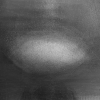

In [0]:
cv2_imshow(photo_avg_trout)

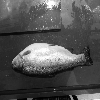

In [0]:
cv2_imshow(np.reshape(testTrout, (100,100)))

In [0]:
X=trainingTrouts-np.tile(avgTrout,(trainingTrouts.shape[1],1)).T
U,S,VT=np.linalg.svd(X,full_matrices=0)

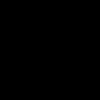

In [0]:
cv2_imshow(np.reshape(U[:,0],(100,100)).T)

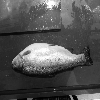

In [0]:
cv2_imshow(np.reshape(testTrout,(100,100)))

In [0]:
testTroutMS=testTrout-avgTrout

In [0]:
r_list=[5,10,15,20,25,29]

In [0]:
m = 100; n=100

In [0]:
U.shape

(10000, 29)

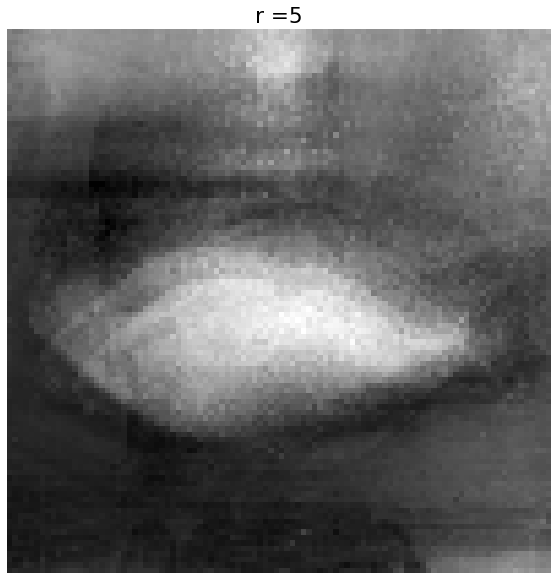

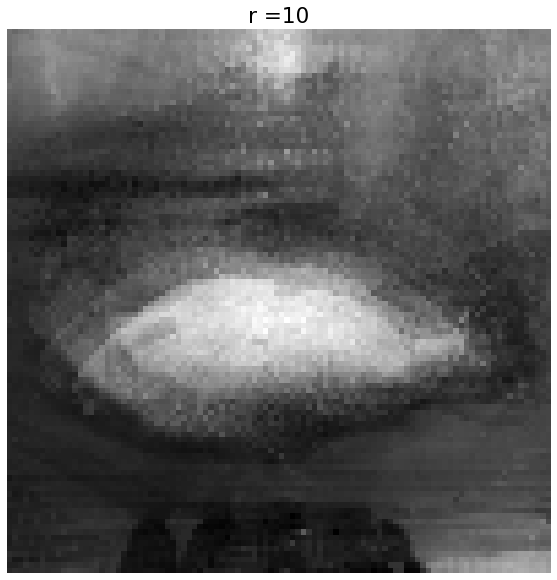

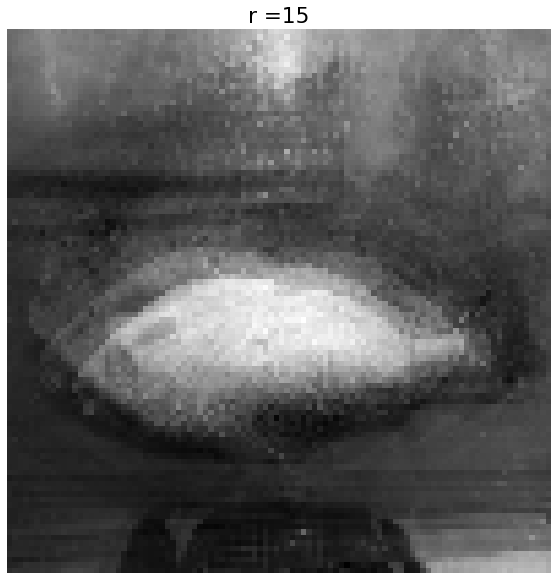

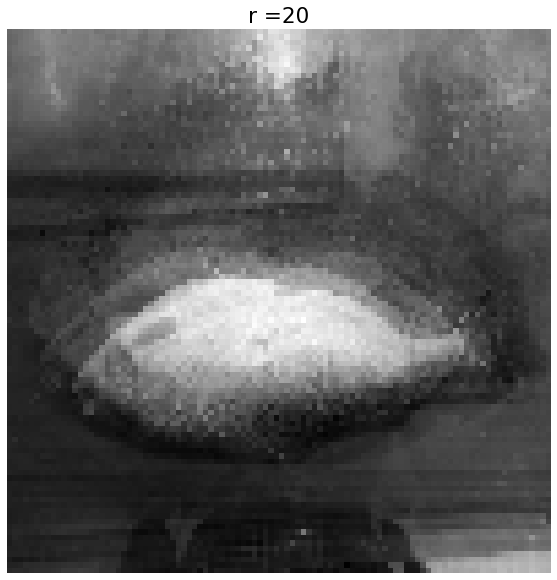

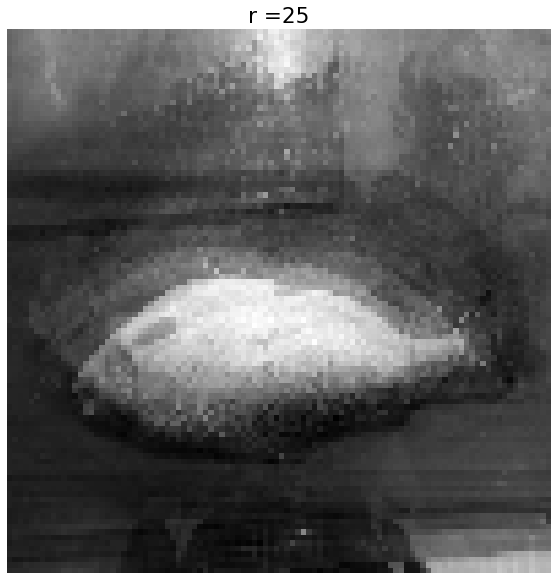

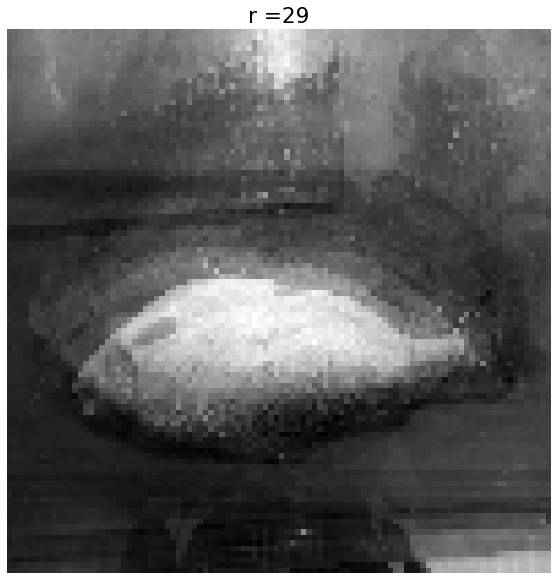

In [0]:
for r in r_list:
	reconTrout=avgTrout+U[:,:r]@U[:,:r].T @ testTroutMS
	img=plt.imshow(np.reshape(reconTrout,(m,n)))
	img.set_cmap('gray')
	plt.title('r ='+str(r))
	plt.axis('off')
	plt.show()

In [0]:
T1num=2
T2num=7

In [0]:
T1=X_arr[:,T1num]
T2=X_arr[:,T2num]

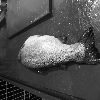

In [0]:
cv2_imshow(np.reshape(T1,(100,100)))

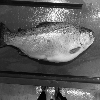

In [0]:
cv2_imshow(np.reshape(T2,(100,100)))

In [0]:
os.listdir(path)

['00002.png',
 '00004.png',
 '00016.png',
 '00013.png',
 '00011.png',
 '00008.png',
 '00012.png',
 '00001.png',
 '00015.png',
 '00017.png',
 '00010.png',
 '00003.png',
 '00006.png',
 '00014.png',
 '00005.png',
 '00007.png',
 '00009.png',
 '00025.png',
 '00022.png',
 '00027.png',
 '00020.png',
 '00024.png',
 '00028.png',
 '00019.png',
 '00029.png',
 '00023.png',
 '00026.png',
 '00018.png',
 '00030.png',
 '00021.png']

In [0]:
U[:,PCAmodes-np.ones_like(PCAmodes)].T.shape

(2, 10000)

In [0]:
PCAmodes=[1,2]
PCACoordsT1=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ T1
PCACoordsT2=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ T2

In [0]:
PCACoordsT1

array([ 2977.12297082, -2713.28636627])

In [0]:
PCACoordsT1.shape

(2,)

In [0]:
PCACoordsT2.shape

(2,)

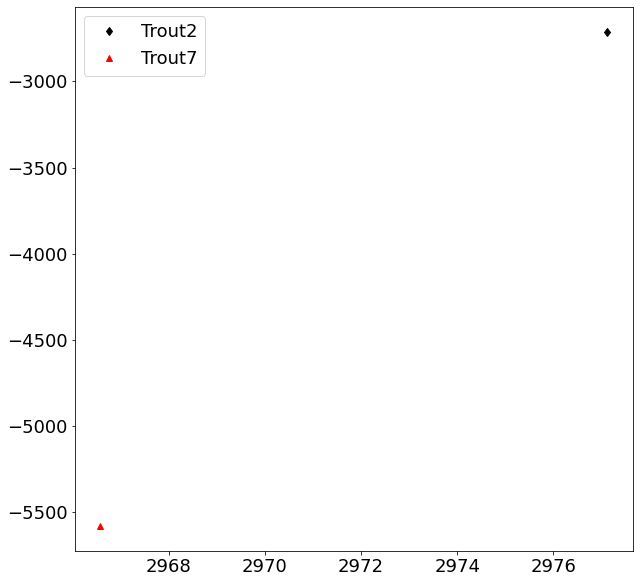

In [0]:

plt.plot(PCACoordsT1[0],PCACoordsT1[1],'d',Color='k',label='Trout2')
plt.plot(PCACoordsT2[0],PCACoordsT2[1],'^',Color='r',label='Trout7')

plt.legend()
plt.show()

## Prueba con varias especies

In [0]:
X = []
species = ['Black Sea Sprat', 'Gilt Head Bream']
path = '/dbfs/mnt/bronce1/Proyecto1/NA_Fish_Dataset/'
for specie in species:
  for  img in os.listdir(path+specie):
      imgpath = os.path.join(path+specie,img)
      pet_img = cv2.imread(imgpath)
      pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
      #cv2_imshow(pet_img)
      try:
        pet_img = cv2.resize(pet_img,(1000,1000))
        #cv2_imshow(pet_img)
        img = np.array(pet_img).flatten().T
        X.append(img)
      except Exception as e:
        print(e)

In [0]:
fishes = np.array(X).T

In [0]:
fishes.shape

(1000000, 100)

In [0]:
fishes[:,0].shape

(1000000,)

In [0]:
m=1000; n=1000

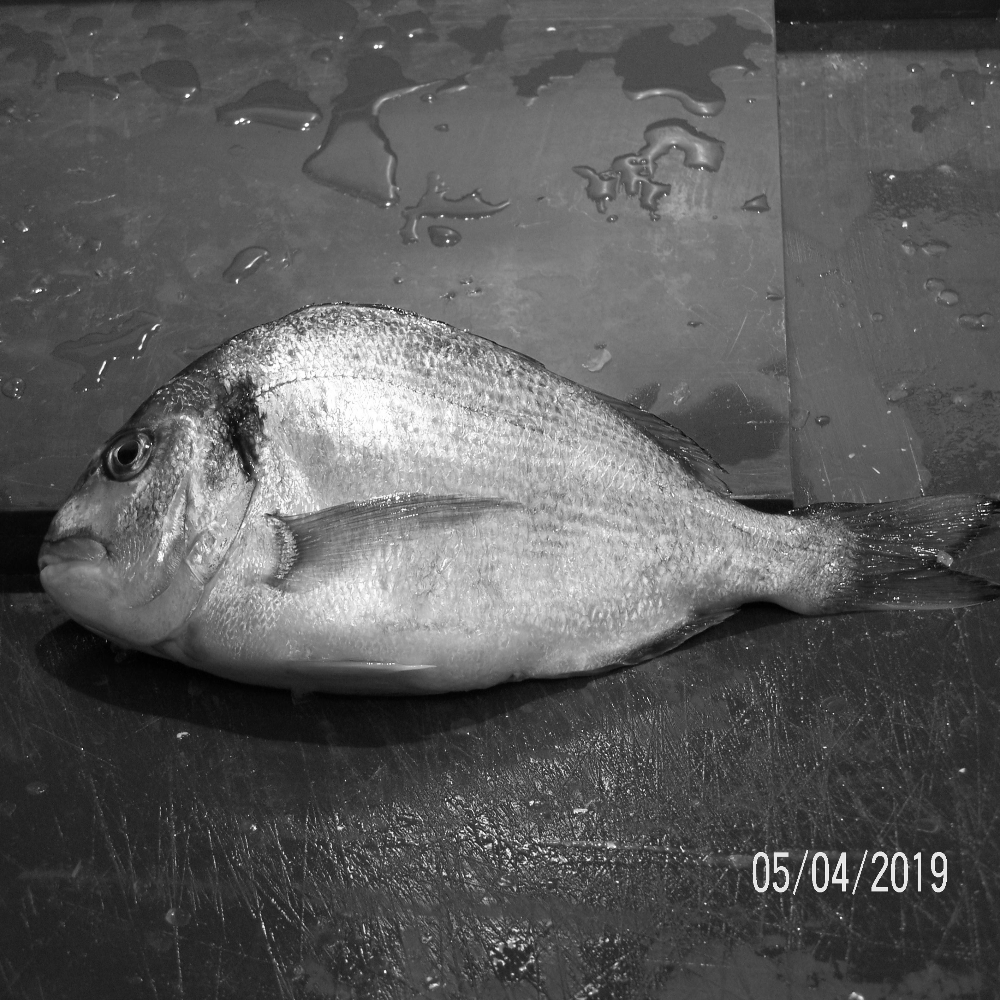

In [0]:
cv2_imshow(np.reshape(fishes[:,52],(m,n)))

In [0]:
avgFish =np.mean(fishes,axis=1)

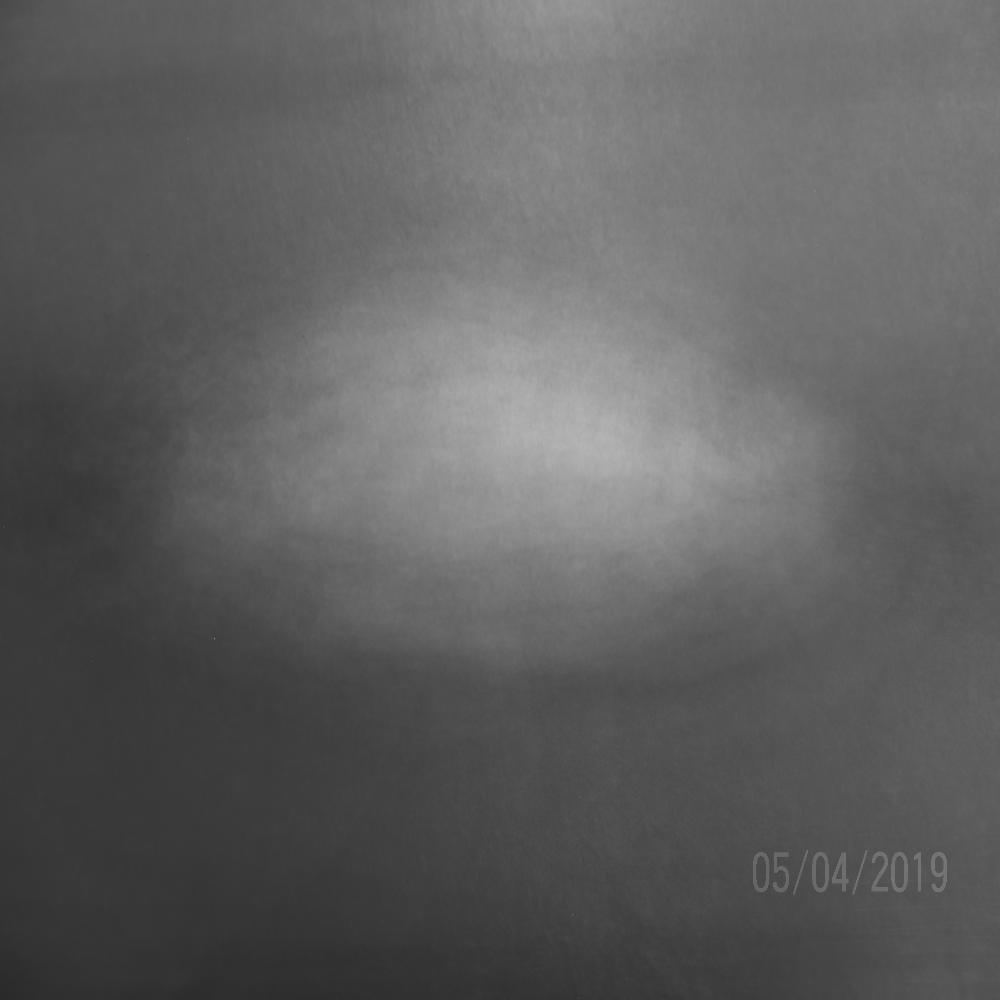

In [0]:
cv2_imshow(np.reshape(avgFish,(m,n)))

In [0]:
X=fishes-np.tile(avgFish,(fishes.shape[1],1)).T
U,S,VT=np.linalg.svd(X,full_matrices=0)

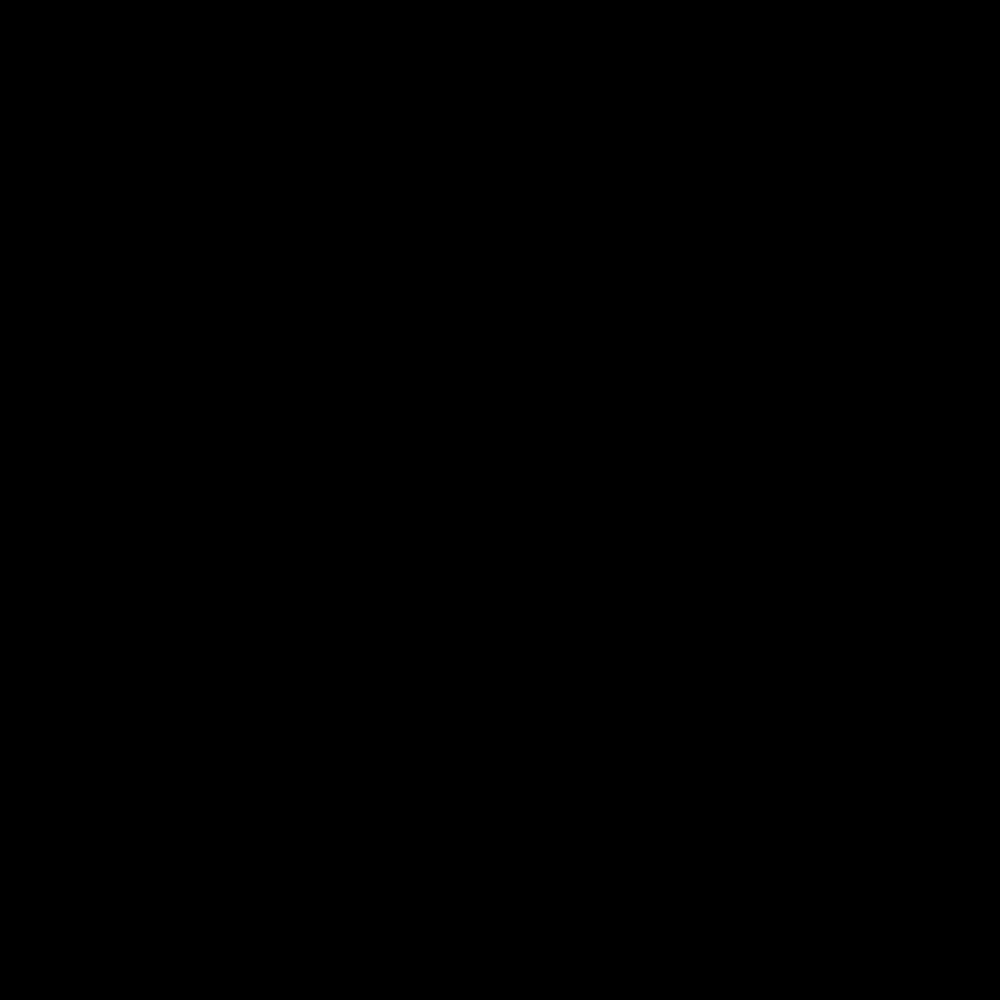

In [0]:
cv2_imshow(np.reshape(U[:,0],(m,n)).T)

In [0]:
F1num=10
F2num=60

In [0]:
F1=fishes[:,0:50]
F2=fishes[:,50:100]

In [0]:
F1.shape

(1000000, 50)

In [0]:
PCAmodes=[1,35]
PCACoordsF1=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F1
PCACoordsF2=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F2

In [0]:
PCACoordsF1.shape

(2, 50)

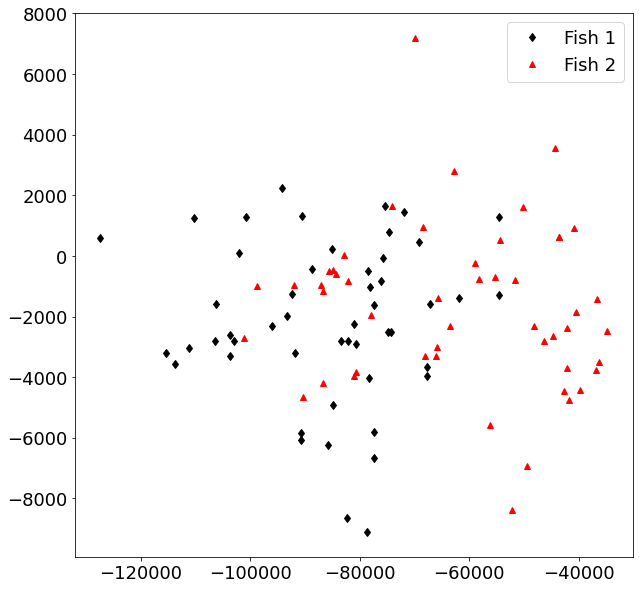

In [0]:
plt.plot(PCACoordsF1[0,:],PCACoordsF1[1,:],'d',Color='k',label='Fish 1')
plt.plot(PCACoordsF2[0,:],PCACoordsF2[1,:],'^',Color='r',label='Fish 2')

plt.legend()
plt.show()



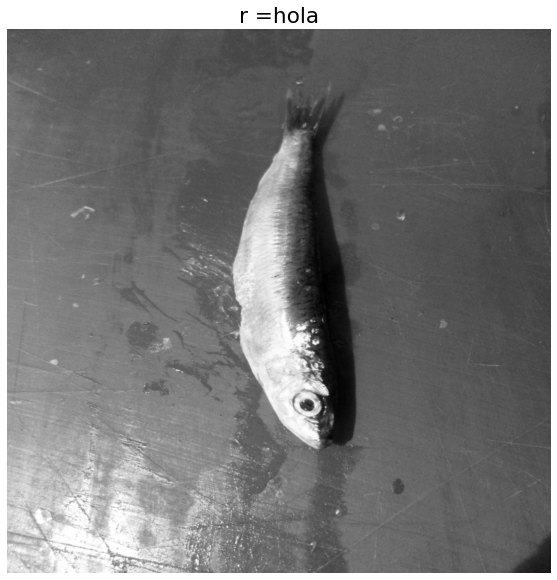

In [0]:
img=plt.imshow(np.reshape(F1[:,0],(m,n)).T)
img.set_cmap('gray')
plt.title('r ='+ "hola")
plt.axis('off')
plt.show()

## Con todas las especies

In [0]:
categorias = ['Black Sea Sprat','Gilt Head Bream','Horse Mackerel','Red Mullet','Red Sea Bream','Sea Bass', 'Shrimp', 'Striped Red Mullet', 'Trout']

In [0]:
m= 500
n = 500
X = []
path = '/dbfs/mnt/bronce1/Proyecto1/NA_Fish_Dataset/'
for specie in categorias:
  for  img in os.listdir(path+specie):
      imgpath = os.path.join(path+specie,img)
      pet_img = cv2.imread(imgpath)
      pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
      #cv2_imshow(pet_img)
      try:
        pet_img = cv2.resize(pet_img,(m,n))
        #cv2_imshow(pet_img)
        img = np.array(pet_img).flatten().T
        X.append(img)
      except Exception as e:
        print(e)

In [0]:
fishes = np.array(X).T

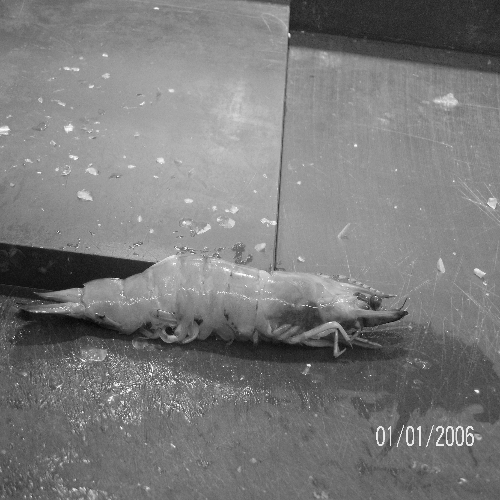

In [0]:
cv2_imshow(np.reshape(fishes[:,300],(m,n)))

In [0]:
avgFish =np.mean(fishes,axis=1)

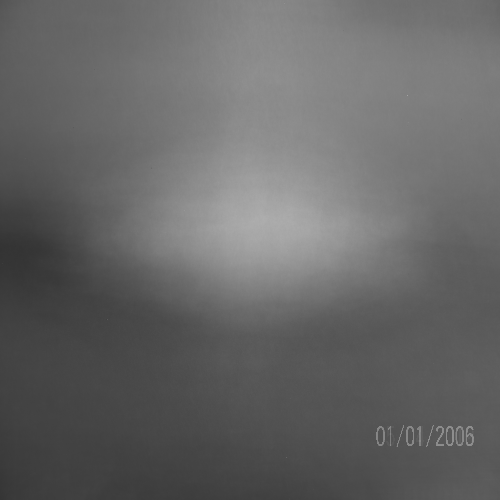

In [0]:
cv2_imshow(np.reshape(avgFish,(m,n)))

In [0]:
X=fishes-np.tile(avgFish,(fishes.shape[1],1)).T

In [0]:
U,S,VT=np.linalg.svd(X,full_matrices=0)

In [0]:
F1num=10 #50 
F2num=70 # 100
F3num=130 #150
F4num=180 #200
F5num=240 # 250
F6num=292 # 300
F7num=315 # 350
F8num=380  # 400
F9num=420 # 430

In [0]:
categorias = ['Black Sea Sprat','Gilt-Head Bream','Hourse Mackerel','Red Mullet','Red Sea Bream','Sea Bass', 'Shrimp', 'Striped Red Mullet', 'Trout']

In [0]:
F1=fishes[:,0:50]
F2=fishes[:,50:100]
F3=fishes[:,100:150]
F4=fishes[:,150:200]
F5=fishes[:,200:250]
F6=fishes[:,250:300]
F7=fishes[:,300:350]
F8=fishes[:,350:400]
F9=fishes[:,400:430]

In [0]:
PCAmodes=[1,2]
PCACoordsF1=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F1
PCACoordsF2=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F2
PCACoordsF3=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F3
PCACoordsF4=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F4
PCACoordsF5=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F5
PCACoordsF6=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F6
PCACoordsF7=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F7
PCACoordsF8=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F8
PCACoordsF9=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F9

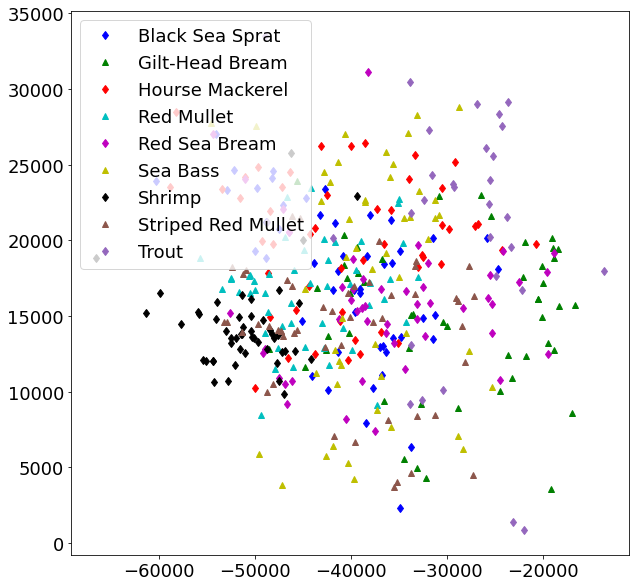

In [0]:
plt.plot(PCACoordsF1[0,:],PCACoordsF1[1,:],'d',Color='b',label=categorias[0])
plt.plot(PCACoordsF2[0,:],PCACoordsF2[1,:],'^',Color='g',label=categorias[1])
plt.plot(PCACoordsF3[0,:],PCACoordsF3[1,:],'d',Color='r',label=categorias[2])
plt.plot(PCACoordsF4[0,:],PCACoordsF4[1,:],'^',Color='c',label=categorias[3])
plt.plot(PCACoordsF5[0,:],PCACoordsF5[1,:],'d',Color='m',label=categorias[4])
plt.plot(PCACoordsF6[0,:],PCACoordsF6[1,:],'^',Color='y',label=categorias[5])
plt.plot(PCACoordsF7[0,:],PCACoordsF7[1,:],'d',Color='k',label=categorias[6])
plt.plot(PCACoordsF8[0,:],PCACoordsF8[1,:],'^',Color='tab:brown',label=categorias[7])
plt.plot(PCACoordsF9[0,:],PCACoordsF9[1,:],'d',Color='tab:purple',label=categorias[8])

plt.legend()
plt.show()

## Blanco y negro, EigenVector

In [0]:
m= 590
n = 445
X = []
limite = 100
path = '/dbfs/mnt/bronce1/Proyecto1/Fish_Dataset/Fish_Dataset/'
for specie in categorias:
  fotos_actuales = 1
  real_path = path+specie+f'/{specie} GT'
  for  img in os.listdir(real_path):
      if fotos_actuales > limite:
        break
      imgpath = os.path.join(real_path,img)
      pet_img = cv2.imread(imgpath)
      pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
      #cv2_imshow(pet_img)
      try:
        pet_img = cv2.resize(pet_img,(m,n))
        #cv2_imshow(pet_img)
        img = np.array(pet_img).flatten()
        X.append(img)
      except Exception as e:
        print(e)
      finally:
        fotos_actuales += 1

In [0]:
np.array(X).shape

(900, 262550)

In [0]:
fishes = np.array(X).T

In [0]:
fishes.shape

(262550, 900)

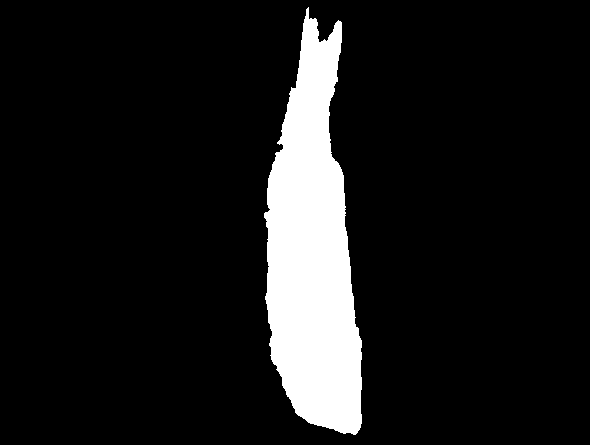

In [0]:
cv2_imshow(np.reshape(fishes[:,701],(n,m)))

In [0]:
avgFish =np.mean(fishes,axis=1)

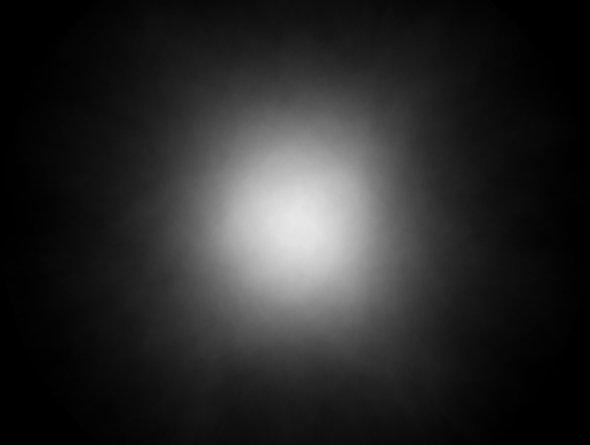

In [0]:
cv2_imshow(np.reshape(avgFish,(n,m)))

In [0]:
X=fishes-np.tile(avgFish,(fishes.shape[1],1)).T

In [0]:
U,S,VT=np.linalg.svd(X,full_matrices=0)

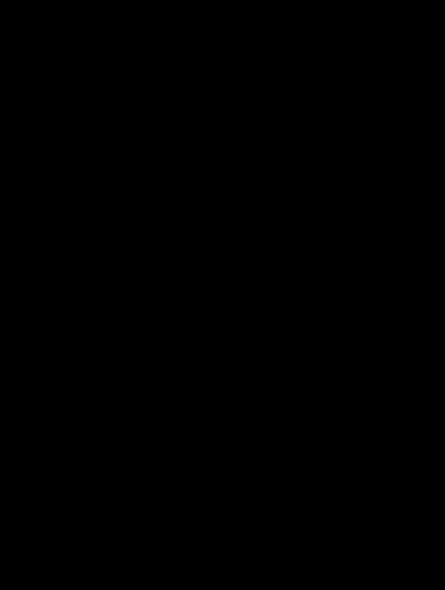

In [0]:
cv2_imshow(np.reshape(U[:,0],(n,m)).T)

In [0]:
F1num=10 #50 
F2num=120 # 100
F3num=230 #150
F4num=380 #200
F5num=440 # 250
F6num=592 # 300
F7num=615 # 350
F8num=780  # 400
F9num=820 # 430

In [0]:
F1=fishes[:,0:100]
F2=fishes[:,100:200]
F3=fishes[:,200:300]
F4=fishes[:,300:400]
F5=fishes[:,400:500]
F6=fishes[:,500:600]
F7=fishes[:,600:700]
F8=fishes[:,700:800]
F9=fishes[:,800:900]

In [0]:
PCAmodes=[1,2]
PCACoordsF1=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F1
PCACoordsF2=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F2
PCACoordsF3=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F3
PCACoordsF4=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F4
PCACoordsF5=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F5
PCACoordsF6=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F6
PCACoordsF7=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F7
PCACoordsF8=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F8
PCACoordsF9=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F9

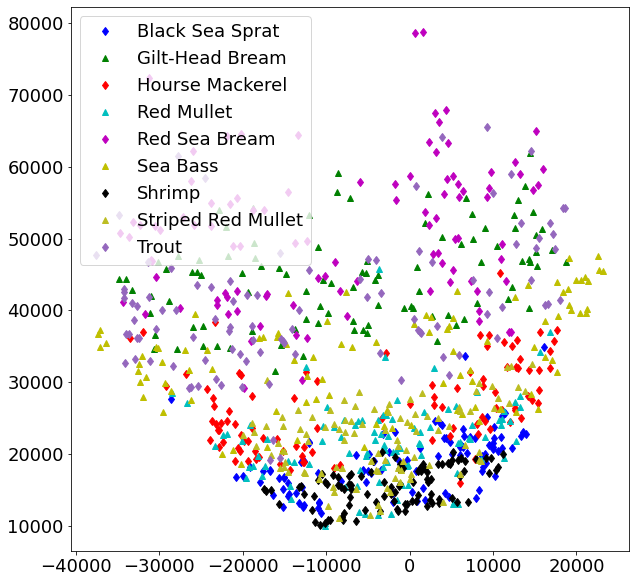

In [0]:
plt.plot(PCACoordsF1[0,:],PCACoordsF1[1,:],'d',Color='b',label=categorias[0])
plt.plot(PCACoordsF2[0,:],PCACoordsF2[1,:],'^',Color='g',label=categorias[1])
plt.plot(PCACoordsF3[0,:],PCACoordsF3[1,:],'d',Color='r',label=categorias[2])
plt.plot(PCACoordsF4[0,:],PCACoordsF4[1,:],'^',Color='c',label=categorias[3])
plt.plot(PCACoordsF5[0,:],PCACoordsF5[1,:],'d',Color='m',label=categorias[4])
plt.plot(PCACoordsF6[0,:],PCACoordsF6[1,:],'^',Color='y',label=categorias[5])
plt.plot(PCACoordsF7[0,:],PCACoordsF7[1,:],'d',Color='k',label=categorias[6])
plt.plot(PCACoordsF8[0,:],PCACoordsF8[1,:],'^',Color='tab:olive',label=categorias[7])
plt.plot(PCACoordsF9[0,:],PCACoordsF9[1,:],'d',Color='tab:purple',label=categorias[8])

plt.legend()
plt.show()

Mejor resultado con las componentes [1,2]

## Prueba con las de color, repetidas

In [0]:
m= 590
n = 445
X = []
limite = 100000
path = '/dbfs/mnt/bronce1/Proyecto1/Fish_Dataset/Fish_Dataset/'
for specie in categorias:
  fotos_actuales = 1
  real_path = path+specie+f'/{specie}'
  print(specie)
  for  img in os.listdir(real_path):
      if fotos_actuales > limite:
        break
      imgpath = os.path.join(real_path,img)
      pet_img = cv2.imread(imgpath)
      pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
      #cv2_imshow(pet_img)
      try:
        pet_img = cv2.resize(pet_img,(m,n))
        #cv2_imshow(pet_img)
        img = np.array(pet_img).flatten()
        X.append(img)
      except Exception as e:
        print(e)
      finally:
        fotos_actuales += 1

Black Sea Sprat
Gilt-Head Bream
Hourse Mackerel
Red Mullet
Red Sea Bream
Sea Bass
Shrimp
Striped Red Mullet
Trout

In [0]:
fishes = np.array(X).T

In [0]:
fishes.shape

Out[10]: (787650, 900)

Out[22]:

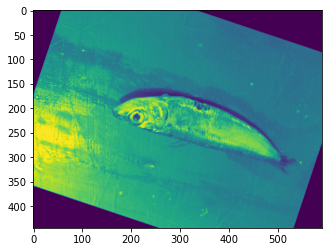

<matplotlib.image.AxesImage at 0x7f174ee5aa00>

In [0]:
plt.imshow(np.reshape(fishes[:,52],(n,m)))

In [0]:
avgFish =np.mean(fishes,axis=1)

In [0]:
plt.imshow(np.reshape(avgFish,(n,m)))

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362757> in <module> 
 ----> 1 plt . imshow ( np . reshape ( avgFish , ( n , m ) ) ) 

 NameError : name 'n' is not defined

In [0]:
X=fishes-np.tile(avgFish,(fishes.shape[1],1)).T

In [0]:
U,S,VT=np.linalg.svd(X,full_matrices=0)

In [0]:
F1num=10 #50 
F2num=1020 # 100
F3num=2030 #150
F4num=3080 #200
F5num=4040 # 250
F6num=5092 # 300
F7num=6015 # 350
F8num=7080  # 400
F9num=8020 # 430

In [0]:
F1=fishes[:,0:1000]
F2=fishes[:,1000:2000]
F3=fishes[:,2000:3000]
F4=fishes[:,3000:4000]
F5=fishes[:,4000:5000]
F6=fishes[:,5000:6000]
F7=fishes[:,6000:7000]
F8=fishes[:,7000:8000]
F9=fishes[:,8000:9000]

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-407257955291060> in <module> 
 ----> 1 F1 = fishes [ : , 0 : 1000 ] 
 2 F2 = fishes [ : , 1000 : 2000 ] 
 3 F3 = fishes [ : , 2000 : 3000 ] 
 4 F4 = fishes [ : , 3000 : 4000 ] 
 5 F5 = fishes [ : , 4000 : 5000 ] 

 NameError : name 'fishes' is not defined

In [0]:
PCAmodes=[1,2]
PCACoordsF1=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F1
PCACoordsF2=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F2
PCACoordsF3=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F3
PCACoordsF4=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F4
PCACoordsF5=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F5
PCACoordsF6=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F6
PCACoordsF7=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F7
PCACoordsF8=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F8
PCACoordsF9=U[:,PCAmodes-np.ones_like(PCAmodes)].T @ F9

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-407257955291062> in <module> 
 1 PCAmodes = [ 1 , 2 ] 
 ----> 2 PCACoordsF1 = U [ : , PCAmodes - np . ones_like ( PCAmodes ) ] . T @ F1
 3 PCACoordsF2 = U [ : , PCAmodes - np . ones_like ( PCAmodes ) ] . T @ F2
 4 PCACoordsF3 = U [ : , PCAmodes - np . ones_like ( PCAmodes ) ] . T @ F3
 5 PCACoordsF4 = U [ : , PCAmodes - np . ones_like ( PCAmodes ) ] . T @ F4

 NameError : name 'U' is not defined

In [0]:
plt.plot(PCACoordsF1[0,:],PCACoordsF1[1,:],'d',Color='b',label=categorias[0])
plt.plot(PCACoordsF2[0,:],PCACoordsF2[1,:],'^',Color='g',label=categorias[1])
plt.plot(PCACoordsF3[0,:],PCACoordsF3[1,:],'d',Color='r',label=categorias[2])
plt.plot(PCACoordsF4[0,:],PCACoordsF4[1,:],'^',Color='c',label=categorias[3])
plt.plot(PCACoordsF5[0,:],PCACoordsF5[1,:],'d',Color='m',label=categorias[4])
plt.plot(PCACoordsF6[0,:],PCACoordsF6[1,:],'^',Color='y',label=categorias[5])
plt.plot(PCACoordsF7[0,:],PCACoordsF7[1,:],'d',Color='k',label=categorias[6])
plt.plot(PCACoordsF8[0,:],PCACoordsF8[1,:],'^',Color='tab:olive',label=categorias[7])
plt.plot(PCACoordsF9[0,:],PCACoordsF9[1,:],'d',Color='tab:purple',label=categorias[8])

plt.legend()
plt.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-407257955291061> in <module> 
 ----> 1 plt . plot ( PCACoordsF1 [ 0 , : ] , PCACoordsF1 [ 1 , : ] , 'd' , Color = 'b' , label = categorias [ 0 ] ) 
 2 plt . plot ( PCACoordsF2 [ 0 , : ] , PCACoordsF2 [ 1 , : ] , '^' , Color = 'g' , label = categorias [ 1 ] ) 
 3 plt . plot ( PCACoordsF3 [ 0 , : ] , PCACoordsF3 [ 1 , : ] , 'd' , Color = 'r' , label = categorias [ 2 ] ) 
 4 plt . plot ( PCACoordsF4 [ 0 , : ] , PCACoordsF4 [ 1 , : ] , '^' , Color = 'c' , label = categorias [ 3 ] ) 
 5 plt . plot ( PCACoordsF5 [ 0 , : ] , PCACoordsF5 [ 1 , : ] , 'd' , Color = 'm' , label = categorias [ 4 ] ) 

 NameError : name 'plt' is not defined

## k-means

In [0]:
from sklearn.cluster import MiniBatchKMeans

In [0]:
nro_clusters = 2

In [0]:
kmeans = MiniBatchKMeans(n_clusters = nro_clusters)

In [0]:
m= 590
n = 445
X = []
limite = 700
path = '/dbfs/mnt/bronce1/Proyecto1/Fish_Dataset/Fish_Dataset/Gilt-Head Bream/Gilt-Head Bream'
for  img in os.listdir(path):
    if limite <= 0:
      break
    imgpath = os.path.join(path,img)
    pet_img = cv2.imread(imgpath)
    #pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
    #cv2_imshow(pet_img)
    try:
      pet_img = cv2.resize(pet_img,(m,n))
      #cv2_imshow(pet_img)
      img = np.array(pet_img).flatten()
      X.append(img)
    except Exception as e:
      print(e)
    limite -= 1

In [0]:
fishes = np.array(X)

In [0]:
fishes.shape

Out[24]: (700, 787650)

In [0]:
kmeans.fit(fishes)

MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
 init_size=None, max_iter=100, max_no_improvement=10,
 n_clusters=2, n_init=3, random_state=None,
 reassignment_ratio=0.01, tol=0.0, verbose=0)

In [0]:
etiquetas = kmeans.labels_

In [0]:
etiquetas.shape

(700,)

In [0]:
etiquetas

array([0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1,
 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0,
 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0,
 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1,
 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0,
 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1,
 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1,
 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1,
 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0,
 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0,
 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1,
 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0,
 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0,
 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1,
 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0,
 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1,
 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1,
 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0,
 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1,
 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,
 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1,
 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1,
 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], dtype=int32)

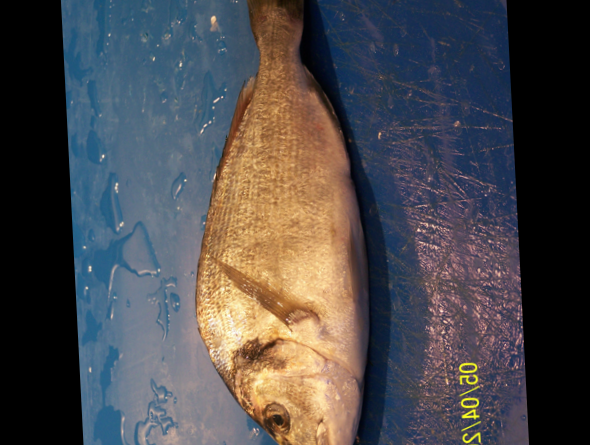

In [0]:
cv2_imshow(np.reshape(fishes[10,:], (445,590,3)))

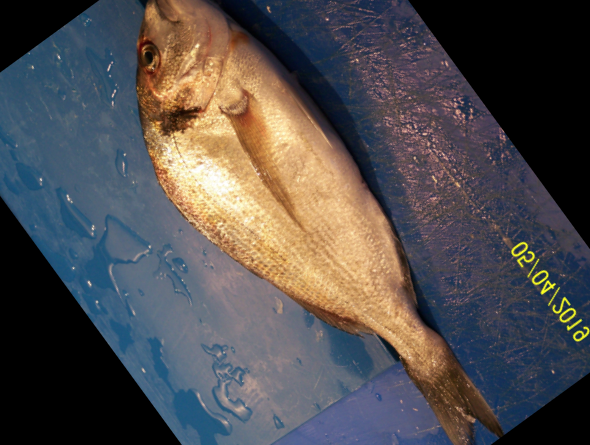

In [0]:
cv2_imshow(np.reshape(fishes[11,:], (445,590,3)))

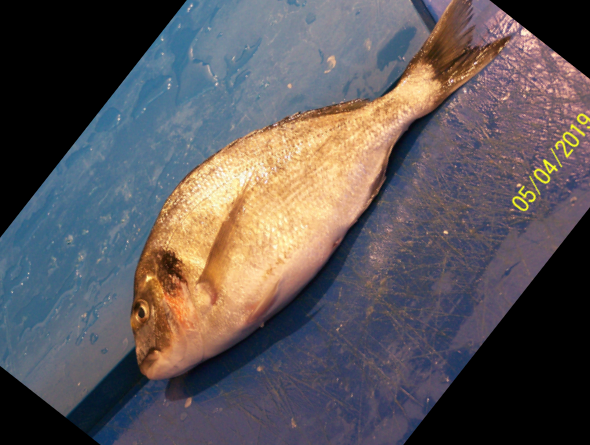

In [0]:
cv2_imshow(np.reshape(fishes[5,:], (445,590,3)))

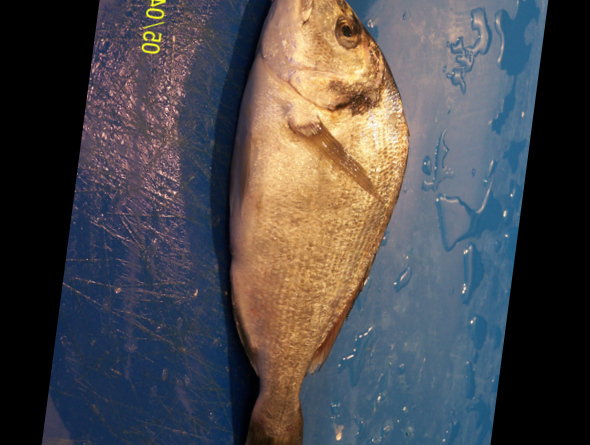

In [0]:
cv2_imshow(np.reshape(fishes[7,:], (445,590,3)))

## Kmeans -> todas las especies

In [0]:
from sklearn.cluster import MiniBatchKMeans

In [0]:
m= 590
n = 445
X = []
limite = 100
path = '/dbfs/mnt/bronce1/Proyecto1/Fish_Dataset/Fish_Dataset/'
for specie in categorias:
  fotos_actuales = 1
  real_path = path+specie+f'/{specie}'
  for  img in os.listdir(real_path):
      if fotos_actuales > limite:
        break
      imgpath = os.path.join(real_path,img)
      pet_img = cv2.imread(imgpath)
      #pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
      #cv2_imshow(pet_img)
      try:
        pet_img = cv2.resize(pet_img,(m,n))
        #cv2_imshow(pet_img)
        img = np.array(pet_img).flatten()
        X.append(img)
      except Exception as e:
        print(e)
      finally:
        fotos_actuales += 1

In [0]:
fishes = np.array(X)

In [0]:
fishes.shape

Out[28]: (900, 787650)

In [0]:
pick_in = open('/dbfs/mnt/bronce1/Proyecto1/out/datafishes.pickle','wb')
pickle.dump(fishes,pick_in)
pick_in.close()

In [0]:
pick_out = open('/dbfs/mnt/bronce1/Proyecto1/out/datafishes.pickle','rb')
#pick_out = open('/content/drive/MyDrive/data1.pickle','rb')
fishes = pickle.load(pick_out)
pick_out.close()

In [0]:
nro_clusters = 9

In [0]:
kmeans = MiniBatchKMeans(n_clusters = nro_clusters)

In [0]:
np.random.shuffle(fishes)

In [0]:
kmeans.fit(fishes)

Out[10]: MiniBatchKMeans(n_clusters=9)

In [0]:
etiquetas = kmeans.labels_

In [0]:
etiquetas

Out[12]: array([6, 8, 0, 5, 3, 3, 2, 6, 4, 7, 6, 3, 6, 5, 2, 0, 1, 1, 4, 6, 6, 2,
 5, 6, 2, 2, 7, 1, 3, 4, 6, 7, 2, 5, 3, 7, 2, 2, 1, 6, 6, 4, 1, 7,
 1, 6, 6, 3, 6, 1, 3, 4, 6, 6, 7, 2, 2, 3, 2, 4, 1, 1, 0, 8, 1, 2,
 6, 0, 6, 3, 8, 3, 4, 4, 6, 2, 5, 1, 5, 3, 2, 6, 2, 3, 3, 8, 6, 3,
 7, 6, 3, 3, 0, 2, 6, 3, 1, 2, 6, 6, 6, 7, 4, 5, 3, 3, 3, 3, 3, 0,
 7, 3, 4, 7, 3, 6, 6, 8, 8, 6, 5, 8, 7, 6, 4, 1, 2, 6, 4, 2, 3, 6,
 3, 3, 4, 6, 2, 7, 4, 5, 7, 0, 6, 3, 2, 2, 6, 1, 6, 2, 7, 0, 7, 1,
 7, 8, 7, 6, 6, 6, 3, 1, 5, 6, 6, 6, 7, 1, 6, 8, 0, 5, 3, 0, 3, 3,
 7, 2, 7, 1, 7, 3, 6, 2, 2, 4, 0, 7, 5, 6, 7, 1, 5, 3, 3, 2, 5, 3,
 3, 2, 1, 6, 5, 1, 0, 8, 3, 8, 5, 2, 2, 1, 4, 7, 8, 3, 5, 1, 4, 6,
 2, 2, 7, 6, 1, 2, 6, 5, 3, 3, 6, 5, 3, 7, 7, 2, 5, 7, 0, 6, 6, 0,
 3, 2, 5, 2, 3, 4, 3, 5, 6, 6, 6, 3, 3, 8, 1, 7, 2, 2, 6, 7, 4, 5,
 5, 1, 5, 2, 3, 5, 3, 2, 3, 3, 6, 8, 5, 7, 6, 3, 6, 6, 3, 2, 8, 3,
 7, 5, 5, 2, 0, 6, 4, 2, 5, 6, 3, 4, 6, 6, 6, 6, 7, 6, 8, 3, 3, 6,
 3, 2, 0, 2, 6, 3, 5, 2, 5, 4, 5, 4, 6, 3, 3, 4, 4, 5, 5, 4, 4, 6,
 1, 6, 0, 6, 3, 2, 7, 5, 1, 4, 2, 7, 6, 1, 5, 3, 6, 4, 6, 6, 6, 6,
 3, 7, 8, 6, 6, 2, 2, 3, 5, 6, 3, 3, 7, 0, 4, 2, 5, 3, 5, 1, 2, 6,
 6, 1, 6, 5, 1, 2, 6, 6, 2, 8, 7, 8, 5, 3, 6, 6, 3, 2, 4, 1, 8, 1,
 3, 4, 4, 1, 1, 6, 1, 3, 7, 4, 7, 1, 5, 8, 5, 6, 1, 6, 3, 1, 6, 8,
 0, 0, 3, 6, 6, 3, 6, 5, 8, 2, 1, 2, 7, 6, 5, 2, 3, 4, 6, 7, 3, 2,
 8, 7, 1, 0, 8, 8, 4, 1, 5, 3, 4, 1, 2, 4, 6, 3, 2, 3, 6, 7, 6, 0,
 7, 2, 4, 5, 6, 3, 3, 6, 3, 3, 6, 3, 3, 8, 6, 3, 2, 4, 0, 6, 6, 8,
 2, 2, 1, 3, 3, 6, 5, 7, 3, 6, 2, 0, 7, 3, 6, 8, 1, 6, 6, 3, 7, 4,
 5, 3, 1, 3, 3, 3, 6, 6, 2, 7, 3, 2, 2, 2, 6, 5, 6, 8, 5, 5, 5, 8,
 6, 6, 8, 3, 5, 5, 6, 5, 1, 5, 6, 2, 0, 2, 6, 3, 3, 1, 6, 3, 3, 7,
 1, 2, 3, 8, 6, 8, 4, 6, 7, 2, 6, 4, 1, 6, 2, 6, 1, 4, 4, 1, 3, 3,
 1, 6, 5, 7, 5, 2, 2, 2, 5, 4, 7, 5, 1, 5, 1, 4, 8, 1, 2, 1, 3, 3,
 3, 6, 3, 3, 3, 2, 3, 6, 2, 8, 1, 6, 3, 6, 8, 4, 7, 3, 8, 3, 4, 6,
 5, 6, 8, 7, 0, 5, 6, 6, 2, 8, 6, 1, 5, 7, 2, 3, 0, 8, 4, 1, 3, 4,
 8, 7, 6, 4, 7, 0, 5, 3, 3, 7, 3, 6, 7, 2, 4, 8, 3, 6, 3, 2, 2, 2,
 1, 6, 6, 2, 7, 2, 7, 6, 2, 6, 0, 4, 2, 3, 1, 7, 6, 1, 1, 2, 6, 1,
 0, 3, 2, 8, 4, 7, 6, 6, 7, 6, 6, 1, 1, 7, 3, 4, 6, 3, 1, 6, 7, 8,
 1, 3, 4, 5, 6, 7, 6, 8, 7, 5, 2, 2, 2, 4, 8, 4, 5, 3, 1, 6, 3, 8,
 7, 3, 5, 1, 3, 3, 4, 7, 2, 3, 3, 6, 3, 3, 0, 4, 5, 2, 4, 4, 7, 0,
 5, 3, 4, 6, 6, 6, 7, 5, 6, 6, 6, 4, 5, 3, 2, 3, 3, 4, 2, 3, 6, 3,
 3, 6, 5, 3, 3, 3, 8, 8, 7, 4, 3, 3, 5, 5, 5, 1, 7, 3, 3, 7, 2, 6,
 7, 1, 2, 1, 1, 4, 7, 8, 2, 7, 4, 2, 7, 7, 3, 1, 1, 3, 6, 1, 6, 3,
 7, 1, 6, 4, 5, 8, 4, 6, 4, 3, 0, 2, 4, 1, 5, 7, 6, 7, 6, 1, 6, 4,
 3, 5, 0, 3, 5, 3, 7, 6, 4, 4, 3, 6, 6, 6, 4, 2, 7, 2, 2, 7, 2, 3,
 0, 3, 5, 5, 6, 8, 6, 7, 6, 3, 5, 6, 1, 6, 8, 6, 4, 3, 6, 6, 3, 1,
 1, 2, 5, 6, 3, 6, 5, 2, 1, 1, 2, 7, 5, 3, 6, 2, 5, 2, 5, 6],
 dtype=int32)

In [0]:
np.reshape(fishes[1,:], (445,590,3)).shape

Out[13]: (445, 590, 3)

Out[28]:

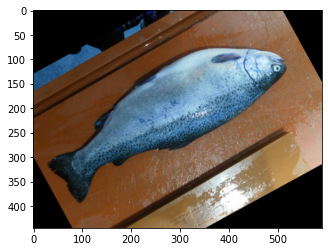

<matplotlib.image.AxesImage at 0x7fbfcd5244c0>

In [0]:
plt.imshow(np.reshape(fishes[0,:], (445,590,3)))

Out[29]:

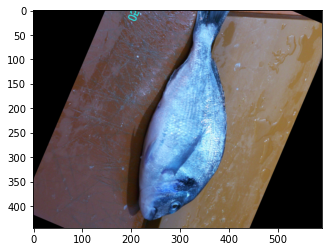

<matplotlib.image.AxesImage at 0x7fbfcd47d220>

In [0]:
plt.imshow(np.reshape(fishes[7,:], (445,590,3)))

Out[16]:

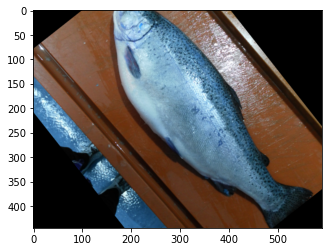

<matplotlib.image.AxesImage at 0x7fbfcd8822b0>

In [0]:
plt.imshow(np.reshape(fishes[6,:], (445,590,3)))

Out[17]:

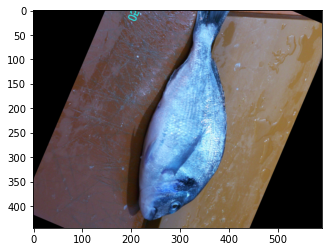

<matplotlib.image.AxesImage at 0x7fbfcd85d490>

In [0]:
plt.imshow(np.reshape(fishes[7,:], (445,590,3)))

Out[18]:

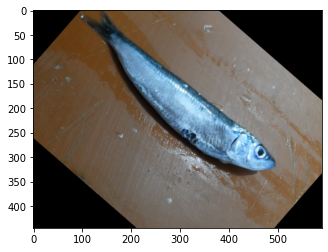

<matplotlib.image.AxesImage at 0x7fbfcd7b6550>

In [0]:
plt.imshow(np.reshape(fishes[21,:], (445,590,3)))

Out[19]:

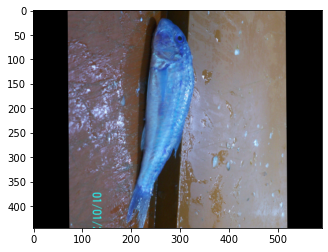

<matplotlib.image.AxesImage at 0x7fbfcd791700>

In [0]:
plt.imshow(np.reshape(fishes[4,:], (445,590,3)))

Out[23]:

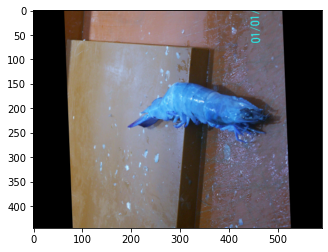

<matplotlib.image.AxesImage at 0x7fbfcd63c8e0>

In [0]:
plt.imshow(np.reshape(fishes[5,:], (445,590,3)))

6
8
0
5
3
3
2
6
4
7
6
3

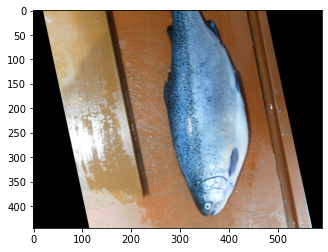

In [0]:
for i in range(12):
  print(etiquetas[i])
  plt.imshow(np.reshape(fishes[i,:], (445,590,3)))

Out[24]:

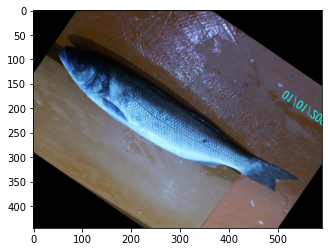

<matplotlib.image.AxesImage at 0x7fbfcd613a30>

In [0]:
plt.imshow(np.reshape(fishes[16,:], (445,590,3)))

Out[27]:

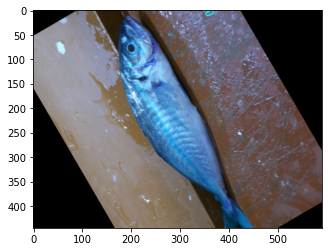

<matplotlib.image.AxesImage at 0x7fbfcd54c6d0>

In [0]:
plt.imshow(np.reshape(fishes[17,:], (445,590,3)))

### Convolucional 2

In [0]:
path = '/dbfs/mnt/bronce1/Proyecto1/Fish_Dataset/Fish_Dataset/'

In [0]:
categorias = ['Black Sea Sprat','Gilt-Head Bream','Hourse Mackerel','Red Mullet','Red Sea Bream','Sea Bass', 'Shrimp', 'Striped Red Mullet', 'Trout']

In [0]:
m= 590
n = 445

In [0]:

X = []
labels = []
limite = 100
path = '/dbfs/mnt/bronce1/Proyecto1/Fish_Dataset/Fish_Dataset/'
for specie in categorias:
  label = categorias.index(specie)
  fotos_actuales = 1
  real_path = path+specie+f'/{specie}'
  for  img in os.listdir(real_path):
      if fotos_actuales > limite:
        break
      imgpath = os.path.join(real_path,img)
      pet_img = cv2.imread(imgpath)
      #pet_img = cv2.cvtColor(pet_img, cv2.COLOR_BGR2GRAY)
      #cv2_imshow(pet_img)
      try:
        pet_img = cv2.resize(pet_img,(m,n))
        #cv2_imshow(pet_img)
        img = np.array(pet_img).flatten()
        X.append(img)
        labels.append(label)
      except Exception as e:
        print(e)
      finally:
        fotos_actuales += 1

In [0]:
img_rows, img_cols = m, n

In [0]:
data_arr = np.array(X)
labels_arr = np.array(labels)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362845> in <module> 
 ----> 1 data_arr = np . array ( X ) 
 2 labels_arr = np . array ( labels ) 

 NameError : name 'np' is not defined

In [0]:
X_train, X_test, Y_train, Y_test = train_test_split(data_arr,labels_arr,train_size=0.8)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362846> in <module> 
 ----> 1 X_train , X_test , Y_train , Y_test = train_test_split ( data_arr , labels_arr , train_size = 0.8 ) 

 NameError : name 'train_test_split' is not defined

In [0]:
X_train_sh = X_train.reshape(X_train.shape[0], img_rows, img_cols, 3)

In [0]:

X_test_sh = X_test.reshape(X_test.shape[0], img_rows, img_cols, 3)

In [0]:
X_test.shape

Out[38]: (180, 787650)

In [0]:
X_test_d = X_test[0:160]
X_val = X_test[160:180]

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362850> in <module> 
 ----> 1 X_test_d = X_test [ 0 : 160 ] 
 2 X_val = X_test [ 160 : 180 ] 

 NameError : name 'X_test' is not defined

In [0]:
Y_test_d = Y_test[0:160]
Y_val = Y_test[160:180]

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362851> in <module> 
 ----> 1 Y_test_d = Y_test [ 0 : 160 ] 
 2 Y_val = Y_test [ 160 : 180 ] 

 NameError : name 'Y_test' is not defined

In [0]:
input_shape = (img_rows, img_cols, 3)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362852> in <module> 
 ----> 1 input_shape = ( img_rows , img_cols , 3 ) 

 NameError : name 'img_rows' is not defined

In [0]:

X_train_sh = X_train_sh.astype('float32')
X_test_sh = X_test_sh.astype('float32')


In [0]:
X_train_sh /= 255
X_test_sh /= 255

In [0]:
num_classes = 9

In [0]:
Y_train_c = keras.utils.to_categorical(Y_train, num_classes)
Y_test_c = keras.utils.to_categorical(Y_test, num_classes)

In [0]:
model = Sequential()#add model layers
model.add(Conv2D(32, kernel_size=(5, 5),
                     activation='relu',
                     input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2, 2)))
# add second convolutional layer with 20 filters
model.add(Conv2D(64, (5, 5), activation='relu'))

# add 2D pooling layer
model.add(MaxPooling2D(pool_size=(2, 2)))

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362856> in <module> 
 ----> 1 model = Sequential ( ) #add model layers 
 2 model.add(Conv2D(32, kernel_size=(5, 5),
 3 activation = 'relu' , 
 4 input_shape=input_shape))
 5 model . add ( MaxPooling2D ( pool_size = ( 2 , 2 ) ) ) 

 NameError : name 'Sequential' is not defined

In [0]:
model.add(Flatten())
    
# add a dense all-to-all relu layer
model.add(Dense(1024, activation='relu'))
    
# apply dropout with rate 0.5
model.add(Dropout(0.5))

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362857> in <module> 
 ----> 1 model . add ( Flatten ( ) ) 
 2 
 3 # add a dense all-to-all relu layer 
 4 model . add ( Dense ( 1024 , activation = 'relu' ) ) 
 5 

 NameError : name 'model' is not defined

In [0]:
model.add(Dense(num_classes, activation='softmax'))
#compile model using accuracy to measure model performance
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362858> in <module> 
 ----> 1 model . add ( Dense ( num_classes , activation = 'softmax' ) ) 
 2 #compile model using accuracy to measure model performance 
 3 model . compile ( optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = [ 'accuracy' ] ) 

 NameError : name 'model' is not defined

In [0]:
model.fit(X_train_sh, Y_train, validation_data=(X_test_sh, Y_test), epochs=11)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362859> in <module> 
 ----> 1 model . fit ( X_train_sh , Y_train , validation_data = ( X_test_sh , Y_test ) , epochs = 11 ) 

 NameError : name 'model' is not defined

In [0]:
model.summary()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362860> in <module> 
 ----> 1 model . summary ( ) 

 NameError : name 'model' is not defined

In [0]:
score = model.evaluate(X_test_sh, Y_test, verbose=1)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362861> in <module> 
 ----> 1 score = model . evaluate ( X_test_sh , Y_test , verbose = 1 ) 

 NameError : name 'model' is not defined

In [0]:
y_predict = np.argmax(model.predict(X_test_sh), axis=-1)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362862> in <module> 
 ----> 1 y_predict = np . argmax ( model . predict ( X_test_sh ) , axis = - 1 ) 

 NameError : name 'model' is not defined

In [0]:
confusion_m = tf.math.confusion_matrix(Y_test, y_predict)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362863> in <module> 
 ----> 1 confusion_m = tf . math . confusion_matrix ( Y_test , y_predict ) 

 NameError : name 'y_predict' is not defined

In [0]:
confusion_m

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3393704034362864> in <module> 
 ----> 1 confusion_m

 NameError : name 'confusion_m' is not defined